In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%pylab inline
%config InlineBackend.figure_formats = ['retina']
sns.set()

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

Populating the interactive namespace from numpy and matplotlib


In [15]:
all_weeks = {}
for week in range(1,34): 
    data = pd.read_csv(f'data/GW{week}.csv') 
    all_weeks[week] = data 

In [16]:
all_weeks[33]

,name,position,team,GW,OPP,Pts,Mins.P,Gls_S,Assists,Cln_Sht,...,Saves,Bonus,BPS,Inf,Crt,Thrt,ICT,Net_T,SB,price_£
0,Bruno Miguel Borges Fernandes,Midfielder,Man Utd,33,LEE (A) 0 - 0,3,90,0,0,1,...,0,0,13,6.0,34.0,37.0,7.7,-13044,4680945,11.6
1,Mohamed Salah,Midfielder,Liverpool,33,NEW (H) 1 - 1,9,90,1,0,0,...,0,2,24,42.6,38.8,52.0,13.3,327227,2937549,12.6
2,Emiliano Martínez,Goalkeeper,Aston Villa,33,WBA (H) 2 - 2,2,90,0,0,0,...,3,0,14,21.6,0.0,0.0,2.2,55448,3315235,5.4
3,Patrick Bamford,Forward,Leeds,33,MUN (H) 0 - 0,1,90,0,0,1,...,0,0,1,7.4,22.9,2.0,3.2,-2844,3581341,6.5
4,Jamie Vardy,Forward,Leicester,33,CRY (H) 2 - 1,2,90,0,0,0,...,0,0,5,2.6,3.1,40.0,4.6,405142,1988095,10.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
550,Taylor Perry,Midfielder,Wolves,33,BUR (H) 0 - 4,0,0,0,0,0,...,0,0,0,0.0,0.0,0.0,0.0,40,943,4.4
551,Luke Cundle,Midfielder,Wolves,33,BUR (H) 0 - 4,0,0,0,0,0,...,0,0,0,0.0,0.0,0.0,0.0,-1,1192,4.5
552,Léo Bonatini,Forward,Wolves,33,BUR (H) 0 - 4,0,0,0,0,0,...,0,0,0,0.0,0.0,0.0,0.0,-15,9135,4.8
553,Leonardo Campana,Forward,Wolves,33,BUR (H) 0 - 4,0,0,0,0,0,...,0,0,0,0.0,0.0,0.0,0.0,-79,24435,4.8


In [36]:
#dding the next gameweeks total points to current week statistic for each player
weekly = {}
for week in all_weeks: 
    #we cannot add gw 33 here because we do not have the reults for gw 32 to predict and score against yet as gw32 is not played yet
    if week != 33: 
        df = pd.merge(all_weeks[week], all_weeks[week+1][['name', 'Pts']], on='name', how='inner')  
        weekly[week] = df
    else:
        pass

In [58]:
full_df = pd.concat([x[1] for x in list(weekly.items())], axis=0)
full_df.set_index('name', inplace=True)

In [59]:
full_df

,position,team,GW,OPP,Pts_x,Mins.P,Gls_S,Assists,Cln_Sht,Gls_Csd,...,Bonus,BPS,Inf,Crt,Thrt,ICT,Net_T,SB,price_£,Pts_y
name,,,,,,,,,,,,,,,,,,,,,
Harry Kane,Forward,Spurs,1,EVE (H) 0 - 1,2,90,0,0,0,1,...,0,7,8.0,22.5,21.0,5.2,0,894557,10.5,21
Heung-Min Son,Midfielder,Spurs,1,EVE (H) 0 - 1,2,90,0,0,0,1,...,0,10,14.0,46.8,35.0,9.6,0,1724987,9.0,24
Mohamed Salah,Midfielder,Liverpool,1,LEE (H) 4 - 3,20,90,3,0,0,3,...,3,69,117.2,50.1,161.0,32.8,0,1883241,12.0,3
Patrick Bamford,Forward,Leeds,1,LIV (A) 4 - 3,7,61,1,0,0,3,...,1,28,40.0,0.5,27.0,6.8,0,226666,5.5,14
Jamie Vardy,Forward,Leicester,1,WBA (A) 0 - 3,13,90,2,0,1,0,...,3,52,71.2,10.3,36.0,11.8,0,1036141,10.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Taylor Perry,Midfielder,Wolves,32,SHU (H) 1 - 0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,-21,863,4.5,0
Luke Cundle,Midfielder,Wolves,32,SHU (H) 1 - 0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,-17,1161,4.5,0
Léo Bonatini,Forward,Wolves,32,SHU (H) 1 - 0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,-18,9151,4.8,0


# EDA

In [60]:
#Here i'm just rearranging columns
full_df = full_df[['GW','position', 'team', 'OPP', 'Mins.P', 'Gls_S', 'Assists',
       'Cln_Sht', 'Gls_Csd', 'Own_gls', 'Pen_Sc', 'Pen_Msd', 'YC', 'RC',
       'Saves', 'Bonus', 'BPS', 'Inf', 'Crt', 'Thrt', 'ICT', 'Net_T', 'SB',
       'price_£', 'Pts_x', 'Pts_y']]

In [61]:
full_df

,GW,position,team,OPP,Mins.P,Gls_S,Assists,Cln_Sht,Gls_Csd,Own_gls,...,BPS,Inf,Crt,Thrt,ICT,Net_T,SB,price_£,Pts_x,Pts_y
name,,,,,,,,,,,,,,,,,,,,,
Harry Kane,1,Forward,Spurs,EVE (H) 0 - 1,90,0,0,0,1,0,...,7,8.0,22.5,21.0,5.2,0,894557,10.5,2,21
Heung-Min Son,1,Midfielder,Spurs,EVE (H) 0 - 1,90,0,0,0,1,0,...,10,14.0,46.8,35.0,9.6,0,1724987,9.0,2,24
Mohamed Salah,1,Midfielder,Liverpool,LEE (H) 4 - 3,90,3,0,0,3,0,...,69,117.2,50.1,161.0,32.8,0,1883241,12.0,20,3
Patrick Bamford,1,Forward,Leeds,LIV (A) 4 - 3,61,1,0,0,3,0,...,28,40.0,0.5,27.0,6.8,0,226666,5.5,7,14
Jamie Vardy,1,Forward,Leicester,WBA (A) 0 - 3,90,2,0,1,0,0,...,52,71.2,10.3,36.0,11.8,0,1036141,10.0,13,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Taylor Perry,32,Midfielder,Wolves,SHU (H) 1 - 0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,-21,863,4.5,0,0
Luke Cundle,32,Midfielder,Wolves,SHU (H) 1 - 0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,-17,1161,4.5,0,0
Léo Bonatini,32,Forward,Wolves,SHU (H) 1 - 0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,-18,9151,4.8,0,0


In [56]:
full_df.shape

(19984, 26)

In [62]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19984 entries, Harry Kane to Neil Taylor
Data columns (total 26 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   GW        19984 non-null  int64  
 1   position  19984 non-null  object 
 2   team      19984 non-null  object 
 3   OPP       19984 non-null  object 
 4   Mins.P    19984 non-null  int64  
 5   Gls_S     19984 non-null  int64  
 6   Assists   19984 non-null  int64  
 7   Cln_Sht   19984 non-null  int64  
 8   Gls_Csd   19984 non-null  int64  
 9   Own_gls   19984 non-null  int64  
 10  Pen_Sc    19984 non-null  int64  
 11  Pen_Msd   19984 non-null  int64  
 12  YC        19984 non-null  int64  
 13  RC        19984 non-null  int64  
 14  Saves     19984 non-null  int64  
 15  Bonus     19984 non-null  int64  
 16  BPS       19984 non-null  int64  
 17  Inf       19984 non-null  float64
 18  Crt       19984 non-null  float64
 19  Thrt      19984 non-null  float64
 20  ICT       19984 no

In [65]:
#changing GW type to category
full_df['GW'] = full_df.GW.astype('category')

In [67]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19984 entries, Harry Kane to Neil Taylor
Data columns (total 26 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   GW        19984 non-null  category
 1   position  19984 non-null  object  
 2   team      19984 non-null  object  
 3   OPP       19984 non-null  object  
 4   Mins.P    19984 non-null  int64   
 5   Gls_S     19984 non-null  int64   
 6   Assists   19984 non-null  int64   
 7   Cln_Sht   19984 non-null  int64   
 8   Gls_Csd   19984 non-null  int64   
 9   Own_gls   19984 non-null  int64   
 10  Pen_Sc    19984 non-null  int64   
 11  Pen_Msd   19984 non-null  int64   
 12  YC        19984 non-null  int64   
 13  RC        19984 non-null  int64   
 14  Saves     19984 non-null  int64   
 15  Bonus     19984 non-null  int64   
 16  BPS       19984 non-null  int64   
 17  Inf       19984 non-null  float64 
 18  Crt       19984 non-null  float64 
 19  Thrt      19984 non-null  float64 
 

In [68]:
full_df.corr()

,Mins.P,Gls_S,Assists,Cln_Sht,Gls_Csd,Own_gls,Pen_Sc,Pen_Msd,YC,RC,...,BPS,Inf,Crt,Thrt,ICT,Net_T,SB,price_£,Pts_x,Pts_y
Mins.P,1.000000,0.228862,0.219147,0.469053,0.608804,0.052780,0.030823,0.029905,0.272593,0.027129,...,0.766175,0.702787,0.533755,0.466800,0.689244,0.129417,0.322076,0.278905,0.650855,0.481483
Gls_S,0.228862,1.000000,0.151384,0.109852,0.133258,0.003638,-0.003921,0.045713,0.049282,0.001630,...,0.573041,0.687535,0.217840,0.554909,0.612580,0.061326,0.199108,0.260139,0.662886,0.172762
Assists,0.219147,0.151384,1.000000,0.110625,0.125910,-0.001482,-0.003866,0.009995,0.041701,-0.002941,...,0.407682,0.390980,0.389114,0.273536,0.421691,0.057409,0.174351,0.215102,0.457663,0.145375
Cln_Sht,0.469053,0.109852,0.110625,1.000000,-0.165692,-0.013907,0.023557,0.000058,0.096088,0.002557,...,0.513816,0.335140,0.293142,0.254119,0.356121,0.089007,0.167489,0.157713,0.583343,0.257134
Gls_Csd,0.608804,0.133258,0.125910,-0.165692,1.000000,0.088446,0.011890,0.015584,0.185305,0.065835,...,0.360650,0.409563,0.281846,0.246903,0.380216,0.061537,0.172592,0.135609,0.184502,0.266486
Own_gls,0.052780,0.003638,-0.001482,-0.013907,0.088446,1.000000,-0.000863,-0.001255,0.002861,0.025393,...,0.001473,0.017432,0.003798,0.018882,0.016662,0.005751,0.005488,-0.001220,-0.028367,0.016623
Pen_Sc,0.030823,-0.003921,-0.003866,0.023557,0.011890,-0.000863,1.000000,-0.000655,-0.004655,-0.000962,...,0.067491,0.063214,-0.009155,-0.008176,0.019994,-0.002750,0.008209,-0.002939,0.084456,0.034226
Pen_Msd,0.029905,0.045713,0.009995,0.000058,0.015584,-0.001255,-0.000655,1.000000,0.016514,-0.001399,...,0.005463,0.041843,0.038243,0.065730,0.059305,0.011243,0.030560,0.046844,0.011119,0.027375
YC,0.272593,0.049282,0.041701,0.096088,0.185305,0.002861,-0.004655,0.016514,1.000000,-0.009944,...,0.126379,0.155907,0.148219,0.101652,0.161995,0.030439,0.056218,0.041650,0.069049,0.100031
RC,0.027129,0.001630,-0.002941,0.002557,0.065835,0.025393,-0.000962,-0.001399,-0.009944,1.000000,...,-0.032731,-0.006378,0.014201,0.003629,0.003024,-0.001129,0.011480,0.003381,-0.049657,-0.019480


In [71]:
full_df.corr()['Pts_y'].sort_values(ascending=False)

Pts_y      1.000000
Mins.P     0.481483
BPS        0.415319
ICT        0.409716
Inf        0.386792
Pts_x      0.381356
Crt        0.313093
Thrt       0.310070
price_£    0.302795
SB         0.291947
Gls_Csd    0.266486
Cln_Sht    0.257134
Bonus      0.193238
Gls_S      0.172762
Assists    0.145375
Saves      0.134069
Net_T      0.102151
YC         0.100031
Pen_Sc     0.034226
Pen_Msd    0.027375
Own_gls    0.016623
RC        -0.019480
Name: Pts_y, dtype: float64

In [85]:
half1 = full_df[['Mins.P','BPS', 'ICT','Inf','Pts_x','Crt','Thrt','price_£','SB','Gls_Csd','Cln_Sht', 'Pts_y']]
half2 = full_df[['Bonus','Gls_S', 'Assists','Saves','Net_T','YC','Pen_Sc','Pen_Msd','Own_gls','RC','Pts_y']]

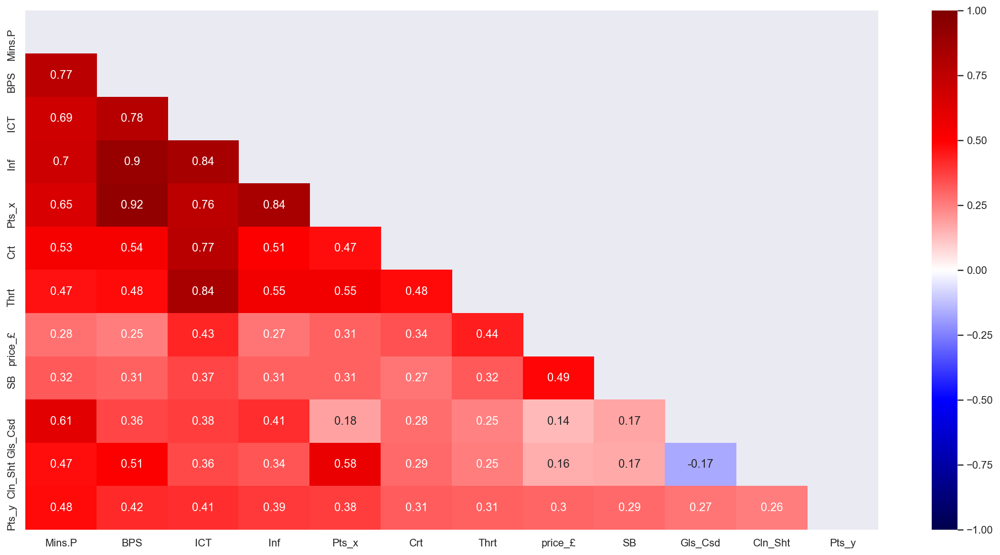

In [87]:
#plt.figure(facecolor='w')
plt.figure(figsize=(20,10))
half1_htmp = sns.heatmap(half1.corr(),mask = np.triu(half1.corr()) ,annot = True,cmap="seismic", vmax = 1, vmin=-1)

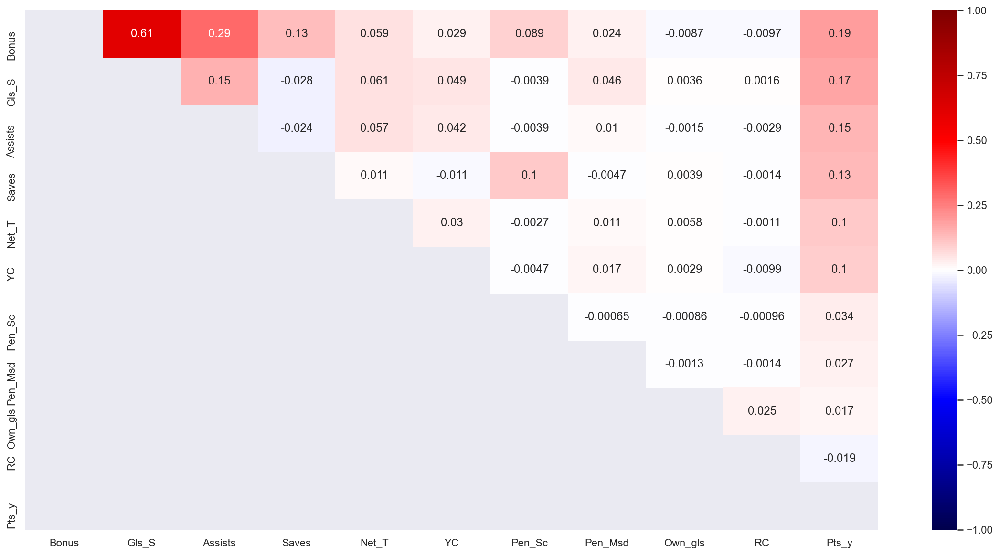

In [88]:
plt.figure(figsize=(20,10))
half2_htmp = sns.heatmap(half2.corr(),mask = np.tril(half2.corr()) ,annot = True,cmap="seismic", vmax = 1, vmin=-1)

In [92]:
plt.figure(figsize=(20,20))
full_pplt = sns.pairplot(full_df)

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

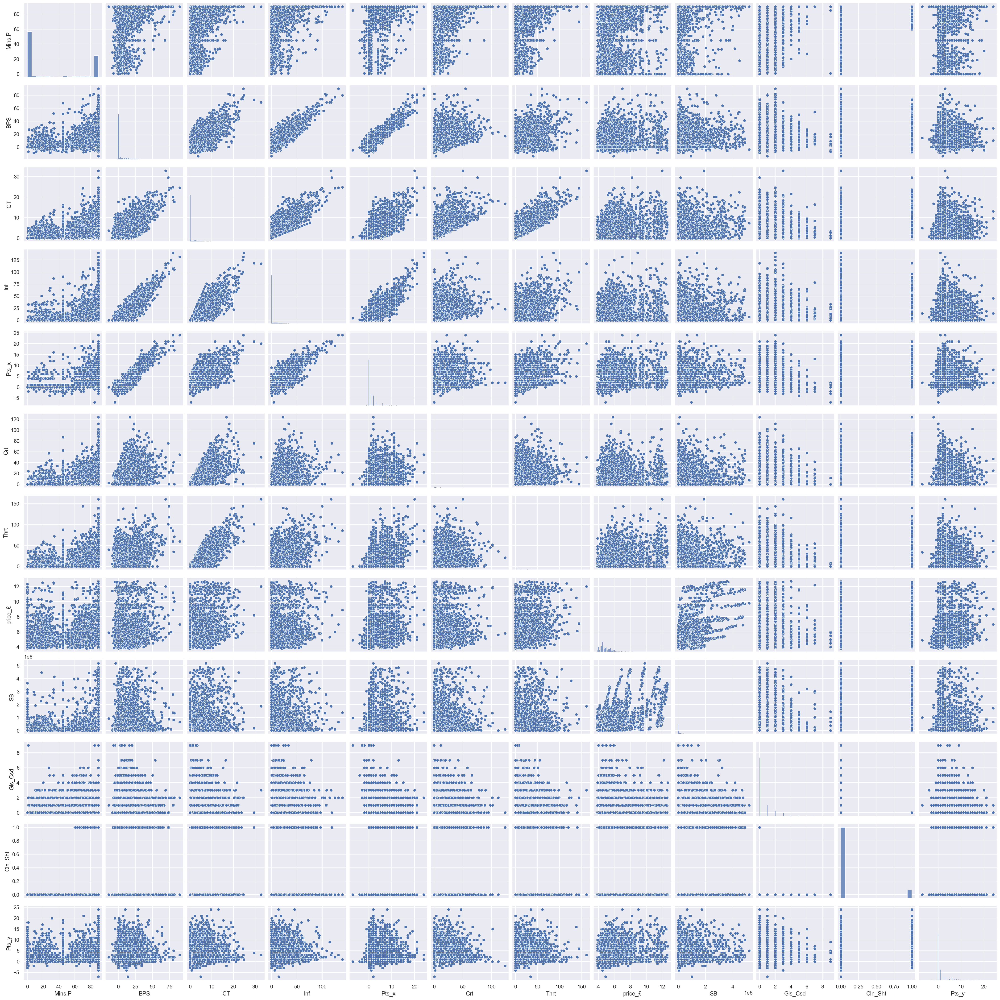

In [90]:
plt.figure(figsize=(20,20))
half1_pplt = sns.pairplot(half1)

<Figure size 1440x1440 with 0 Axes>

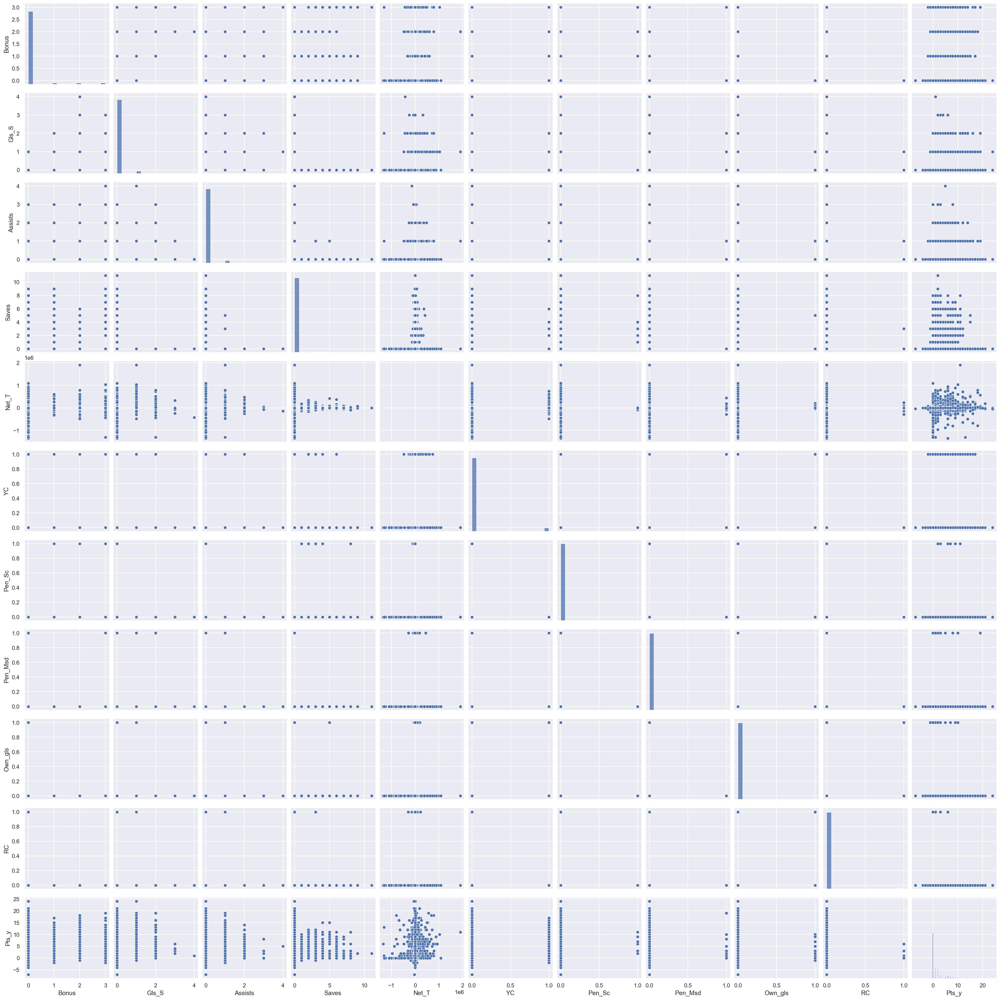

In [91]:
plt.figure(figsize=(20,20))
half2_pplt = sns.pairplot(half2)

In [96]:
X = full_df[['Mins.P','BPS', 'ICT','Inf','Pts_x','Crt','Thrt','price_£','SB','Gls_Csd','Cln_Sht','Bonus','Gls_S', 'Assists','Saves','Net_T','YC','Pen_Sc','Pen_Msd','Own_gls','RC']]
y = full_df['Pts_y']
y.describe()

count    19984.000000
mean         1.314652
std          2.492359
min         -7.000000
25%          0.000000
50%          0.000000
75%          2.000000
max         24.000000
Name: Pts_y, dtype: float64

In [130]:
def split_and_validate(X, y):
    '''
    For a set of features and target X, y, perform a 80/20 train/val split, 
    fit and validate a linear regression model, and report results
    '''   
    # perform train/val/test split
    X_, X_test, y_, y_test = \
        train_test_split(X, y, test_size=0.2, random_state=42) 
    
    X_train, X_val, y_train, y_val = \
        train_test_split(X_, y_, test_size=0.25, random_state=42)    

    # fit linear regression to training data
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)
    
    # score fit model on train data and validation data
    train_score = lr_model.score(X_train, y_train)    
    val_score = lr_model.score(X_val, y_val)

    
    val_preds = lr_model.predict(X_val)      
    
    # report results
    print('\nTraining R^2 score was:', train_score)
    print('Validation R^2 score was:', val_score)

    print('Model Error')
    print('val MSE: ', mean_squared_error(y_val, val_preds)) 
    print('val MAE: ', mean_absolute_error(y_val, val_preds), '\n')      
    print('Feature coefficient results: \n')
    for feature, coef in zip(X.columns, lr_model.coef_):
        print(feature, ':', f'{coef:.2f}')
        
    lr_model.fit(X_, y_)
    test_preds = lr_model.predict(X_test) 
    test_score = lr_model.score(X_test, y_test)
    
    print('\nTest R^2 score was:', test_score)

    print('Model Error')
    print('Test MSE: ', mean_squared_error(y_test, test_preds)) 
    print('Test MAE: ', mean_absolute_error(y_val, test_preds), '\n')      
    print('Feature coefficient results: \n')
    for feature, coef in zip(X.columns, lr_model.coef_):
        print(feature, ':', f'{coef:.2f}')
    
    
        
    

In [131]:
split_and_validate(X, y)


Training R^2 score was: 0.269074126624399
Validation R^2 score was: 0.2944860477720752
Model Error
val MSE:  4.288093191689709
val MAE:  1.2122103171396394 

Feature coefficient results: 

Mins.P : 0.02
BPS : 0.03
ICT : 0.36
Inf : -0.04
Pts_x : 0.03
Crt : -0.03
Thrt : -0.03
price_£ : 0.29
SB : 0.00
Gls_Csd : -0.04
Cln_Sht : -0.01
Bonus : -0.16
Gls_S : -0.22
Assists : -0.27
Saves : 0.16
Net_T : 0.00
YC : -0.02
Pen_Sc : 1.80
Pen_Msd : 1.54
Own_gls : 0.52
RC : -1.09

Test R^2 score was: 0.2782378149929893
Model Error
Test MSE:  4.515217085121185
Test MAE:  1.8636019491272222 

Feature coefficient results: 

Mins.P : 0.02
BPS : 0.02
ICT : 0.72
Inf : -0.07
Pts_x : 0.08
Crt : -0.07
Thrt : -0.06
price_£ : 0.28
SB : 0.00
Gls_Csd : -0.02
Cln_Sht : -0.06
Bonus : -0.18
Gls_S : -0.63
Assists : -0.36
Saves : 0.16
Net_T : 0.00
YC : -0.05
Pen_Sc : 1.49
Pen_Msd : 0.85
Own_gls : 0.15
RC : -1.12


In [118]:
sns.scatter(x='', y='', hue='', data=full_df)

name
Harry Maguire                             5
Rúben Gonçalo Silva Nascimento Vinagre    0
Dane Scarlett                             0
Sofiane Boufal                            0
Max Lowe                                  0
                                         ..
Elliot Anderson                           0
Mario Lemina                              2
Kieran Tierney                            1
Cedric Kipre                              0
Denis Odoi                                0
Name: Pts_y, Length: 3997, dtype: int64

### Cross-Validation

In [132]:

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

X, X_test, y, y_test = train_test_split(X, y, test_size=.2, random_state=10) #hold out 20% of the data for final testing

#this helps with the way kf will generate indices below
X, y = np.array(X), np.array(y)

In [146]:
rand=[]
mean_r2s = []
for i in range(5):
    rand_state = np.random.randint(200)
    rand.append(rand_state)
    simple_lr = LinearRegression()
    kf = KFold(n_splits=5, shuffle=True, random_state = rand_state)
    cv_r2s = cross_val_score(simple_lr, X, y, cv=kf, scoring='r2')
    mean_r2s.append(np.mean(cv_r2s))

In [147]:
rand

[138, 185, 163, 101, 174]

In [148]:
mean_r2s

[0.2814227446858917,
 0.2816526745886381,
 0.2806971427172682,
 0.2800586682244134,
 0.2820253201642161]

In [141]:
np.mean(cv_r2s)

0.28143247520863

In [151]:
simple_lr.fit(X,y)
simple_lr.score(X_test,y_test)

0.2338618753458147